<a href="https://colab.research.google.com/github/ChristopherLiew/Classifying-Red-Wine-Quality/blob/master/Exploratory_Data_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1>Exploratory Data Analysis - Red Wine Quality Dataset</h1>


1.   Exploring Numerical Features + Target Variable with Pandas Profiling
2.   Identifying & rooting out potential Multicollinearity with VIF



In [0]:
#pip install --upgrade pandas-profiling if TypeError() join_axes is encountered

In [0]:
import pandas as pd
import pandas_profiling as pp
import numpy as np
import matplotlib.pyplot as mpl
from statsmodels.stats.outliers_influence import variance_inflation_factor
%matplotlib inline
mpl.style.use('ggplot')

In [11]:
from google.colab import drive 
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [0]:
wine_df = pd.read_csv("/content/gdrive/My Drive/Business Analytics Stuff/BT2101 Group Project/winequality-red.csv")

<h2>Exploring our Quality target variable</h2>

Text(0.5, 1.0, 'Distribution of Red Wine Quality')

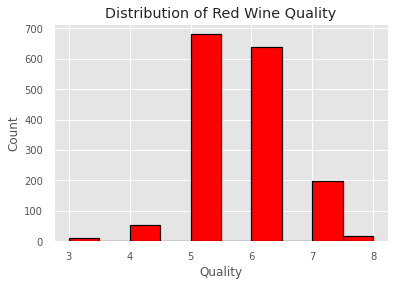

In [13]:
mpl.hist(wine_df['quality'], edgecolor = 'black', linewidth = 1.2, facecolor="red")
mpl.xlabel("Quality")
mpl.ylabel("Count")
mpl.title("Distribution of Red Wine Quality")

<h2>Creating our Good & Other Quality Target Variable</h2>

In [14]:
wine_df["good_quality"] = wine_df["quality"] >= 7
wine_df["good_quality"] = wine_df["good_quality"].astype(int)
wine_df.head(10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,good_quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5,0
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5,0
7,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7,1
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7,1
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5,0


<h2>Quick EDA with Pandas Profiling</h2>

In [15]:
pp.ProfileReport(wine_df)

<h2> Obsevations from EDA</h2>

1.   High number of duplicated rows (15%), thus concern for Data Leakage
2.   Citric, Chlorides, Sulfur Dioxides/ Total Sulfur Dioxide are not Gaussian
3.   Target Variable, *Good Quality*, is is highly imbalanced (86.4% to 13.6%)



<h2>Handling Multicollinearity with VIF</h2>

In [16]:
# Drop Target Variables
test_df = wine_df.copy()
test_df.drop(['quality', 'good_quality'], axis = 1, inplace=True)
test_df.head(10)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4
7,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0
8,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5
9,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5


In [0]:
# Feature Scale
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaled_df = pd.DataFrame(scaler.fit_transform(test_df), columns=test_df.columns)

In [0]:
def calculate_VIF(x):
    threshold = 5
    selected_var = pd.DataFrame()
    ncol = len(x.columns)
    vif = [variance_inflation_factor(x.values, i) for i in range(ncol)]
    for i in range(1,ncol):
        print("Iteration Number: ", i)
        print(vif)
        a = np.argmax(vif)
        print("Max. VIF is for variable number: ", a)
        if (vif[a] <= threshold):
            break
        if (i==1):
            selected_var = x.drop(x.columns[a], axis=1)
            vif = [variance_inflation_factor(selected_var.values, j) for j in range(selected_var.shape[1])]
        elif (i>1):
            print(selected_var.columns[a])
            selected_var = selected_var.drop(selected_var.columns[a], axis=1)
            vif = [variance_inflation_factor(selected_var.values, j) for j in range(selected_var.shape[1])]
    return(selected_var)

In [19]:
selected_features = calculate_VIF(scaled_df)

Iteration Number:  1
[39.6019344144713, 10.323712305233329, 9.088447607308206, 3.990312798861542, 4.98226808096827, 5.916577827037241, 5.3363330297830815, 85.11333138026517, 31.604908898043206, 6.719330052181274, 13.528337946286749]
Max. VIF is for variable number:  7
Iteration Number:  2
[10.929408884482594, 10.067500279242457, 9.085567079305955, 2.585551602311861, 4.911357479606815, 5.877830810295651, 5.287402900756862, 12.352706891855302, 6.2673035471990275, 5.817917262548425]
Max. VIF is for variable number:  7
pH
Iteration Number:  3
[10.718711716642378, 6.6954262609360935, 9.033835550377225, 2.584683526457061, 4.907253766657796, 5.537635599731256, 5.2642859438930705, 6.030141723517278, 4.426666824688132]
Max. VIF is for variable number:  0
fixed acidity
Iteration Number:  4
[4.710845157249852, 3.902644604463877, 2.5668741316045547, 4.812134705895897, 5.491534585738513, 5.0399374118934706, 5.877811936560868, 4.366493035659766]
Max. VIF is for variable number:  6
sulphates
Iteratio

In [20]:
print("Selected features by VIF:")
for i in range(len(selected_features.columns.values.tolist())):
    print(selected_features.columns.values.tolist()[i])

Selected features by VIF:
volatile acidity
citric acid
residual sugar
chlorides
total sulfur dioxide
alcohol
